In [1]:
import pandas as pd
import numpy as np

In [2]:
#Дата сет был трансформирован в экселе - проведен feature eng 
#расчитаны три новые фичи из первоначальных временных рядов представлявших каждый образец и признак: 
#угол наклона кривой, станд отклонение, медиана 
#так же отфильтрованы клиенты по возрастанию и удалены три фичи 'F23', 'F33', 'F34' так как 0 значения

Train = pd.read_excel("D:\Python\Task_BigDataSchool\BigDataSchool3\BigDataSchool_features1.xlsx", decimal = ",")

In [3]:
pd.set_option('display.max_columns', 500)

In [4]:
pd.set_option('display.max_rows', 1000)

In [5]:
Train

,ID,F1slope,F2slope,F3slope,F4slope,F5slope,F6slope,F7slope,F8slope,F9slope,F10slope,F11slope,F12slope,F13slope,F14slope,F15slope,F16slope,F17slope,F18slope,F19slope,F20slope,F21slope,F22slope,F24slope,F26slope,F27slope,F28slope,F29slope,F30slope,F31slope,F32slope,F35slope,F36slope,F37slope,F38slope,F39slope,F40slope,F41slope,F42slope,F43slope,F44slope,F45slope,F46slope,F47slope,F1dev,F2dev,F3dev,F4dev,F5dev,F6dev,F7dev,F8dev,F9dev,F10dev,F11dev,F12dev,F13dev,F14dev,F15dev,F16dev,F17dev,F18dev,F19dev,F20dev,F21dev,F22dev,F24dev,F26dev,F27dev,F28dev,F29dev,F30dev,F31dev,F32dev,F35dev,F36dev,F37dev,F38dev,F39dev,F40dev,F41dev,F42dev,F43dev,F44dev,F45dev,F46dev,F47dev,F1med,F2med,F3med,F4med,F5med,F6med,F7med,F8med,F9med,F10med,F11med,F12med,F13med,F14med,F15med,F16med,F17med,F18med,F19med,F20med,F21med,F22med,F24med,F26med,F27med,F28med,F29med,F30med,F31med,F32med,F35med,F36med,F37med,F38med,F39med,F40med,F41med,F42med,F43med,F44med,F45med,F46med,F47med
0,1,0.000000,1.0,2.257143,2.285714e-01,0.000000,20.404000,18.173143,1.890286e+00,1.881757,3.389429,0.872000,28.700000,20.554054,1.200000e+00,3.600000,1.885714e+00,8.571429e-02,4.883721e+00,6.216216e-01,2.592286,7.562571e-02,0.000000,0.000000,-2.028571e+00,-6.756757e-02,0.400000,0.685714,0.000000e+00,0.000000e+00,-1.0,4.527027,-2.959459e+00,-5.714286e-02,10.514286,1.714286,-1.714286e-01,-1.142857e-01,1.714286e-01,0.514286,-0.244186,0.000000,2.285714e-01,61.175676,0.000000,2.073644,6.090977,1.032796,0.000000,62.721373,55.987727,17.142441,34.817318,33.543282,9.065386,52.869651,44.257203,19.085771,14.859340,8.594572,7.026142,10.954451,2.489980,16.968974,1.019076,0.000000,0.000000,12.802344,12.389512,7.527727,4.226898,0.000000,0.000000,1.581139,21.575449,16.361540,2.065591,35.844107,4.898979,1.095445,0.516398,0.816497,1.095445,0.547723,0.000000,0.516398,159.054393,9.0,140.0,18.5,0.0,0.0,52.730,27.620,19.115,83.670,63.285,29.475,60.0,41.0,25.0,81.0,53.5,30.5,0.000,2.000,25.560,0.000000,0.000000,0.0,7.0,23.0,26.5,29.0,0.0,0.0,4.0,99.0,32.0,10.0,71.0,147.0,1.0,2.0,2.5,1.0,1.0,0.0,2.0,341.0
1,2,-0.857143,1.0,0.604651,6.900000e+00,0.000000,112.405000,86.669714,-1.710286e+00,-34.598286,-35.634000,1.037143,4.700000,13.914286,-1.621622e-01,-6.000000,-7.628571e+00,1.628571e+00,4.000000e+00,-9.142857e-01,5.855143,1.711741e+01,0.000000,0.000000,0.000000e+00,-4.972973e+00,-4.771429,-0.742857,0.000000e+00,0.000000e+00,-1.0,11.400000,-3.800000e+00,8.571429e-01,27.485714,9.743243,-2.432432e-01,-6.000000e-01,-5.142857e-01,-0.228571,0.000000,0.000000,-5.714286e-02,68.283784,2.309401,1.870829,2.387467,12.589678,0.000000,199.729784,190.796915,5.705912,131.600694,130.963949,3.694870,15.270887,28.780202,2.880972,43.039517,41.470070,4.915960,21.908902,4.131182,23.709204,117.626355,0.000000,0.000000,0.000000,15.093045,13.765900,9.500877,0.000000,0.000000,1.870829,33.731291,42.150919,1.751190,65.807801,30.760364,0.894427,1.169045,1.032796,0.516398,0.000000,0.000000,0.632456,159.777345,6.0,130.5,28.0,7.0,0.0,430.130,451.725,2.700,265.205,264.055,3.850,156.0,139.5,3.0,89.0,85.0,6.0,40.000,0.000,48.750,197.264449,0.000000,0.0,0.0,5.0,6.0,24.0,0.0,0.0,3.5,99.0,138.0,1.5,47.0,114.0,0.0,3.0,3.0,1.0,0.0,0.0,2.0,919.0
2,3,0.000000,1.0,0.285714,-1.742857e+00,0.000000,-20.963143,64.498286,-6.305714e-01,18.074571,18.088286,-0.013714,0.114286,2.428571,-3.142857e-01,-1.028571,-9.714286e-01,-5.714286e-02,2.700000e+00,-2.857143e-01,3.669651,-9.326431e+01,-60.163450,0.000000,0.000000e+00,-1.662791e+00,-0.800000,0.057143,0.000000e+00,0.000000e+00,-1.0,-2.085714,3.285714e+00,1.428571e-01,-4.542857,-15.100000,0.000000e+00,0.000000e+00,8.571429e-02,0.000000,0.000000,0.000000,4.186047e-01,-420.391892,0.000000,1.870829,1.211060,6.892024,0.000000,94.685217,248.128931,3.266769,173.606064,173.603775,0.116733,22.730303,21.958294,2.562551,23.191953,22.689204,0.816497,8.485281,0.816497,13.023129,262.838529,190.796083,0.000000,0.000000,8.927486,6.396614,3.881580,0.000000,0.000000,1.581139,20.232812,11.588788,1.169045,14.770466,26.696442

In [6]:
print(Train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17195 entries, 0 to 17194
Columns: 130 entries, ID to F47med
dtypes: float64(129), int64(1)
memory usage: 17.1 MB
None


In [7]:
print(Train.dtypes)

ID            int64
F1slope     float64
F2slope     float64
F3slope     float64
F4slope     float64
F5slope     float64
F6slope     float64
F7slope     float64
F8slope     float64
F9slope     float64
F10slope    float64
F11slope    float64
F12slope    float64
F13slope    float64
F14slope    float64
F15slope    float64
F16slope    float64
F17slope    float64
F18slope    float64
F19slope    float64
F20slope    float64
F21slope    float64
F22slope    float64
F24slope    float64
F26slope    float64
F27slope    float64
F28slope    float64
F29slope    float64
F30slope    float64
F31slope    float64
F32slope    float64
F35slope    float64
F36slope    float64
F37slope    float64
F38slope    float64
F39slope    float64
F40slope    float64
F41slope    float64
F42slope    float64
F43slope    float64
F44slope    float64
F45slope    float64
F46slope    float64
F47slope    float64
F1dev       float64
F2dev       float64
F3dev       float64
F4dev       float64
F5dev       float64
F6dev       float64


In [8]:
Train.columns

Index(['ID', 'F1slope', 'F2slope', 'F3slope', 'F4slope', 'F5slope', 'F6slope',
       'F7slope', 'F8slope', 'F9slope',
       ...
       'F38med', 'F39med', 'F40med', 'F41med', 'F42med', 'F43med', 'F44med',
       'F45med', 'F46med', 'F47med'],
      dtype='object', length=130)

In [9]:
Train.describe()

,ID,F1slope,F2slope,F3slope,F4slope,F5slope,F6slope,F7slope,F8slope,F9slope,F10slope,F11slope,F12slope,F13slope,F14slope,F15slope,F16slope,F17slope,F18slope,F19slope,F20slope,F21slope,F22slope,F24slope,F26slope,F27slope,F28slope,F29slope,F30slope,F31slope,F32slope,F35slope,F36slope,F37slope,F38slope,F39slope,F40slope,F41slope,F42slope,F43slope,F44slope,F45slope,F46slope,F47slope,F1dev,F2dev,F3dev,F4dev,F5dev,F6dev,F7dev,F8dev,F9dev,F10dev,F11dev,F12dev,F13dev,F14dev,F15dev,F16dev,F17dev,F18dev,F19dev,F20dev,F21dev,F22dev,F24dev,F26dev,F27dev,F28dev,F29dev,F30dev,F31dev,F32dev,F35dev,F36dev,F37dev,F38dev,F39dev,F40dev,F41dev,F42dev,F43dev,F44dev,F45dev,F46dev,F47dev,F1med,F2med,F3med,F4med,F5med,F6med,F7med,F8med,F9med,F10med,F11med,F12med,F13med,F14med,F15med,F16med,F17med,F18med,F19med,F20med,F21med,F22med,F24med,F26med,F27med,F28med,F29med,F30med,F31med,F32med,F35med,F36med,F37med,F38med,F39med,F40med,F41med,F42med,F43med,F44med,F45med,F46med,F47med
count,17195.000000,17195.000000,1.719500e+04,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,1.719500e+04,17120.000000,17105.000000,16092.000000,16093.000000,15778.000000,15778.000000,15778.000000,15778.000000,15233.000000,15244.000000,15253.000000,15595.000000,15594.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17120.000000,17105.000000,16092.000000,16093.000000,15778.000000,15778.000000,15778.000000,15778.000000,15233.000000,15244.000000,15253.000000,15595.000000,15594.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.000000,17195.00000,17195.000000,17195.000000,17195.000000,17187.000000,17192.000000,16396.000000,16402.000000,16055.000000,16049.000000,16047.000000,16056.000000,15581.000000,15585.000000,15586.000000,15850.000000,15858.000000
mean,10305.461413,0.005574,1.000000e+00,0.002395,0.101733,0.000289,3.290091,2.612299,0.434223,4.386508,4.325759,0.388510,-0.195832,-0.266814,0.181875,0.434399,0.218944,0.193402,0.926548,0.023868,0.881040,38.311609,40.608667,-0.000024,-0.020067,-0.008309,0.047561,0.012369,0.030232,0.010848,-1.000000e+00,0.596739,-0.459245,0.291109,5.478558,0.724319,-0.003899,-0.015605,-0.036217,-0.010105,0.016088,0.002326,-0.003313,78.148594,0.347975,1.867157,3.110585,2.840588,0.041527,164.923692,160.944746,7.874997,147.977025,143.906719,10.545357,49.141851,45.427942,4.670021,40.513948,38.327074,5.311006,9.528473,2.999929,21.016111,290.819344,258.617576,0.009407,1.941510,5.296982,5.230458,4.942667,1.519693,0.403130,1.868242,41.204728,27.521761,1.383819,21.527185,22.004582,0.633844,0.848313,0.985142,0.120854,0.089688,0.014887,0.366543,859.298087,12.070893,73.006659,21.353678,6.827566,0.026752,393.615676,378.232263,8.527230,378.219862,359.925988,11.790845,166.078424,150.636551,6.602239,144.172027,134.004071,8.737278,23.639372,1.683915,44.115621,346.953224,274.208133,0.001309,4.507066,13.593021,18.973161,22.00724,1.085839,0.222536,3.498372,157.720254,74.483306,3.273207,41.944245,103.449081,0.798959,1.591731,2.360519,0.727553,0.645557,0.067304,1.170442,1506.632772
std,5499.511939,0.455350,5.273970e-17,1.573757,1.744529,0.040038,99.343427,9

In [10]:
Train.describe().T #вертикальное представление

,count,mean,std,min,25%,50%,75%,max
ID,17195.0,10305.461413,5.499512e+03,1.000000,5808.500000,10431.000000,15017.500000,19681.000000
F1slope,17195.0,0.005574,4.553495e-01,-4.571429,0.000000,0.000000,0.000000,6.600000
F2slope,17195.0,1.000000,5.273970e-17,1.000000,1.000000,1.000000,1.000000,1.000000
F3slope,17195.0,0.002395,1.573757e+00,-8.700000,-0.400000,-0.027027,0.314286,9.400000
F4slope,17195.0,0.101733,1.744529e+00,-9.100000,-0.142857,0.000000,0.142857,10.900000
F5slope,17195.0,0.000289,4.003838e-02,-0.300000,0.000000,0.000000,0.000000,0.400000
F6slope,17195.0,3.290091,9.934343e+01,-1105.800581,-17.883714,0.000000,22.519429,1808.877000
F7slope,17195.0,2.612299,9.748911e+01,-1587.857000,-17.203944,0.000000,20.966714,1556.280000
F8slope,17195.0,0.434223,6.607132e+00,-123.877143,-0.379098,0.000000,0.637571,372.426571
F9slope,17195.0,4.386508,8.504012e+01,-1007.842286,-17.338794,0.000000,22.898286,1588.897429


In [11]:
Train.isnull().sum() # количество пропусков

ID             0
F1slope        0
F2slope        0
F3slope        0
F4slope        0
F5slope        0
F6slope        0
F7slope        0
F8slope        0
F9slope        0
F10slope       0
F11slope       0
F12slope       0
F13slope       0
F14slope       0
F15slope       0
F16slope       0
F17slope       0
F18slope       0
F19slope       0
F20slope       0
F21slope       0
F22slope       0
F24slope       0
F26slope       0
F27slope       0
F28slope       0
F29slope       0
F30slope       0
F31slope       0
F32slope       0
F35slope      75
F36slope      90
F37slope    1103
F38slope    1102
F39slope    1417
F40slope    1417
F41slope    1417
F42slope    1417
F43slope    1962
F44slope    1951
F45slope    1942
F46slope    1600
F47slope    1601
F1dev          0
F2dev          0
F3dev          0
F4dev          0
F5dev          0
F6dev          0
F7dev          0
F8dev          0
F9dev          0
F10dev         0
F11dev         0
F12dev         0
F13dev         0
F14dev         0
F15dev        

In [12]:
Train.count() # количество заполненых

ID          17195
F1slope     17195
F2slope     17195
F3slope     17195
F4slope     17195
F5slope     17195
F6slope     17195
F7slope     17195
F8slope     17195
F9slope     17195
F10slope    17195
F11slope    17195
F12slope    17195
F13slope    17195
F14slope    17195
F15slope    17195
F16slope    17195
F17slope    17195
F18slope    17195
F19slope    17195
F20slope    17195
F21slope    17195
F22slope    17195
F24slope    17195
F26slope    17195
F27slope    17195
F28slope    17195
F29slope    17195
F30slope    17195
F31slope    17195
F32slope    17195
F35slope    17120
F36slope    17105
F37slope    16092
F38slope    16093
F39slope    15778
F40slope    15778
F41slope    15778
F42slope    15778
F43slope    15233
F44slope    15244
F45slope    15253
F46slope    15595
F47slope    15594
F1dev       17195
F2dev       17195
F3dev       17195
F4dev       17195
F5dev       17195
F6dev       17195
F7dev       17195
F8dev       17195
F9dev       17195
F10dev      17195
F11dev      17195
F12dev    

Альтернативное представление поиска пропущеных значений

In [13]:
# Function to calculate missing values by column
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [14]:
missing_values_table(Train)

Your selected dataframe has 130 columns.
There are 39 columns that have missing values.


,Missing Values,% of Total Values
F43dev,1962,11.4
F43slope,1962,11.4
F44slope,1951,11.3
F44dev,1951,11.3
F45dev,1942,11.3
F45slope,1942,11.3
F43med,1614,9.4
F44med,1610,9.4
F45med,1609,9.4
F47slope,1601,9.3


In [15]:
#Train[Train['Название колонки'].isnull()]  #можно посмотреть какие записи содержат пропущенные значения
#Train.drop(Train[Train['Название колонки'].isnull()].index.values, inplace=True)  #можно удалить записи с пропущенными значениями

Посмотрим на распределение количественных признаков:

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001739D9C31D0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x00000173A04849E8>]], dtype=object)

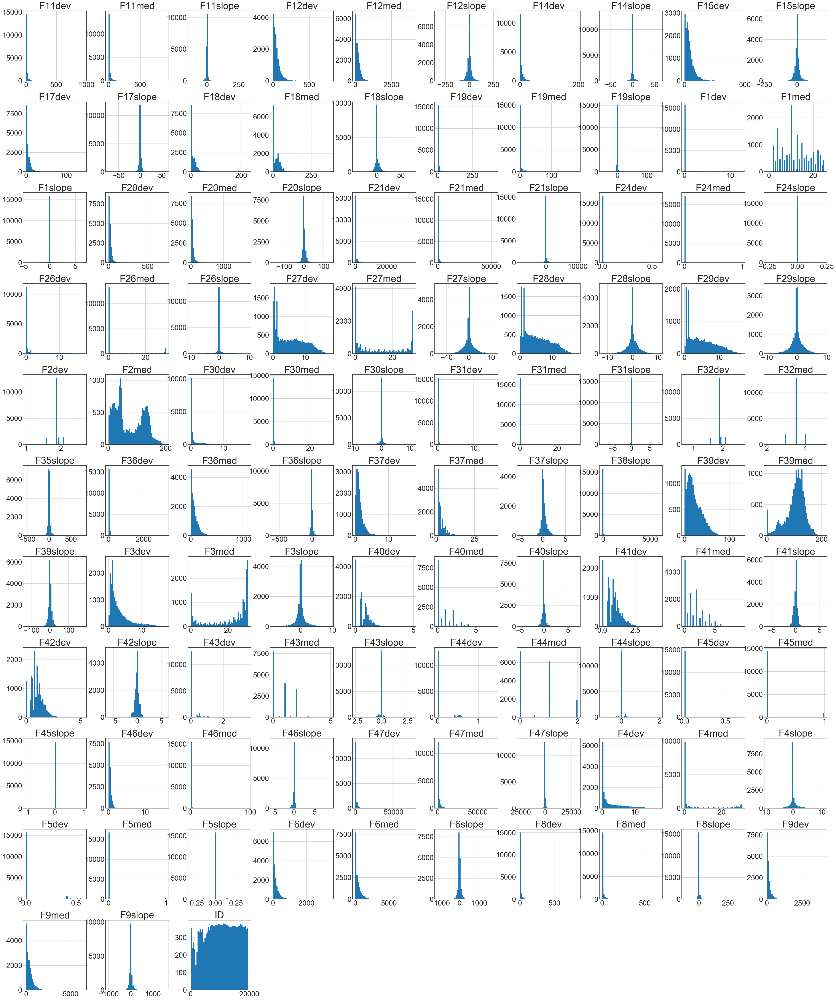

In [71]:
#Train.hist(figsize=(48, 60), bins=50, xlabelsize=10, ylabelsize=8)
import matplotlib

params = {'axes.titlesize':'32',
          'xtick.labelsize':'24',
          'ytick.labelsize':'24'}
matplotlib.rcParams.update(params)
Train.hist(figsize=(48, 60), bins=50)

Альтернативная обработка поиска пропущеных значений и коррелированых признаков с помощью дополнительной библиотеки feature_selector https://proglib.io/p/feature-selector/

In [17]:
from feature_selector import FeatureSelector

In [18]:
fs = FeatureSelector(data = Train)

No labels provided. Feature importance based methods are not available.


In [19]:
fs.identify_missing(missing_threshold = 0.6)

0 features with greater than 0.60 missing values.



In [20]:
fs.missing_stats.head()

,missing_fraction
F43slope,0.114103
F43dev,0.114103
F44dev,0.113463
F44slope,0.113463
F45slope,0.112940


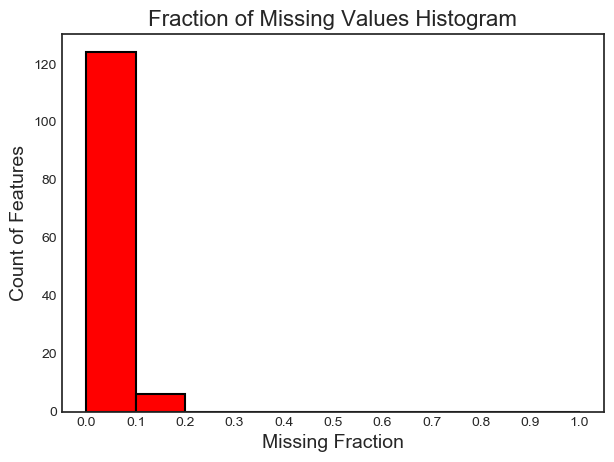

In [21]:
fs.plot_missing()

In [27]:
fs.identify_collinear(correlation_threshold=0.8)

25 features with a correlation magnitude greater than 0.80.



In [28]:
correlated_features = fs.ops['collinear']
correlated_features[:25]

['F7slope',
 'F10slope',
 'F13slope',
 'F16slope',
 'F22slope',
 'F7dev',
 'F10dev',
 'F13dev',
 'F16dev',
 'F22dev',
 'F35dev',
 'F38dev',
 'F7med',
 'F10med',
 'F13med',
 'F14med',
 'F15med',
 'F16med',
 'F17med',
 'F22med',
 'F28med',
 'F29med',
 'F35med',
 'F38med',
 'F42med']

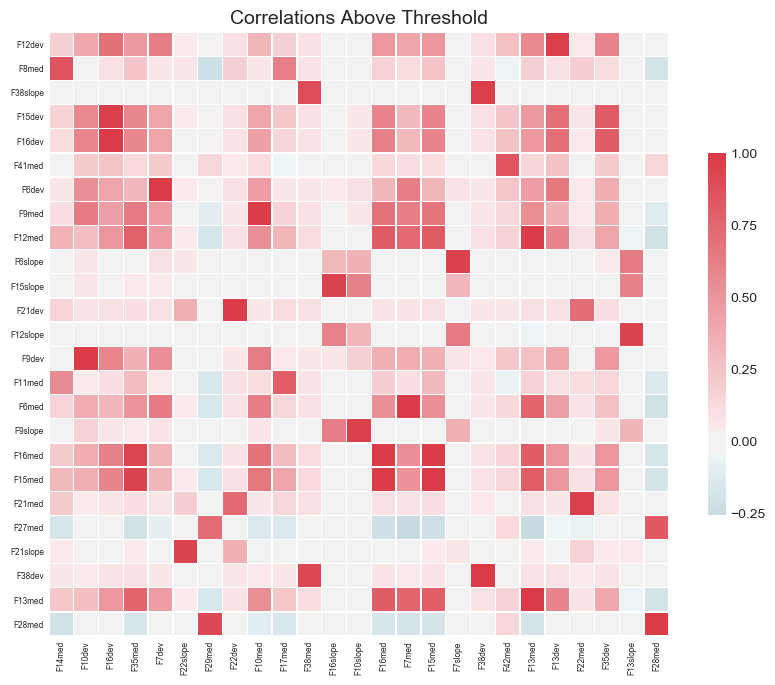

In [29]:
fs.plot_collinear()

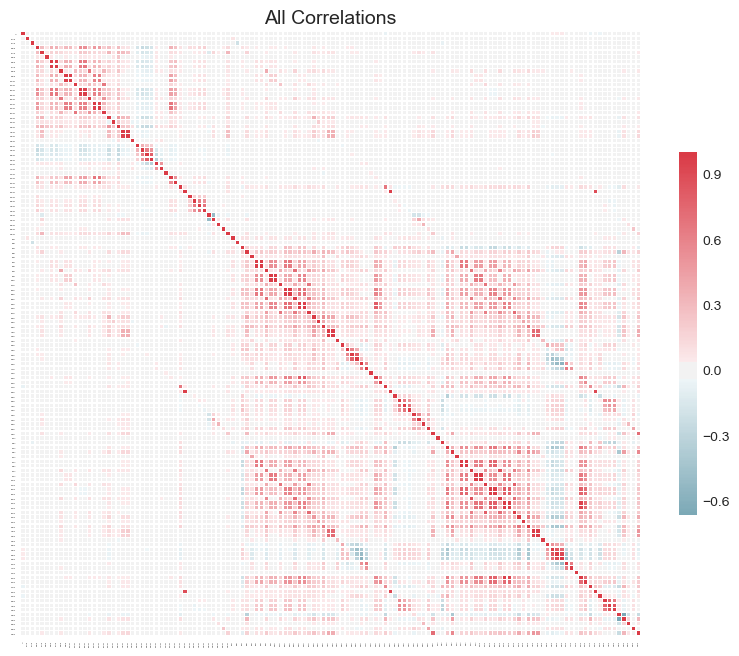

In [30]:
fs.plot_collinear(plot_all=True)

In [31]:
collinear_features = fs.ops['collinear']
fs.record_collinear

,drop_feature,corr_feature,corr_value
0,F7slope,F6slope,0.955622
1,F10slope,F9slope,0.954217
2,F13slope,F12slope,0.947204
3,F16slope,F15slope,0.946971
4,F22slope,F21slope,0.944093
5,F7dev,F6dev,0.984968
6,F10dev,F9dev,0.980542
7,F13dev,F12dev,0.966914
8,F16dev,F15dev,0.968070
9,F22dev,F21dev,0.979840


In [32]:
#Удаляем коррелированые признаки
columns = ['F7slope',
 'F10slope',
 'F13slope',
 'F16slope',
 'F22slope',
 'F7dev',
 'F10dev',
 'F13dev',
 'F16dev',
 'F22dev',
 'F35dev',
 'F38dev',
 'F7med',
 'F10med',
 'F13med',
 'F14med',
 'F15med',
 'F16med',
 'F17med',
 'F22med',
 'F28med',
 'F29med',
 'F35med',
 'F38med',
 'F42med']
Train.drop(columns, axis=1, inplace=True)

In [33]:
#Удаляем  признаки с однаковым значением по всему столбцу
columns = ['F2slope',
 'F32slope']
Train.drop(columns, axis=1, inplace=True)

In [34]:
#Смотрим еще раз на данные
Train.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,17195.0,10305.461413,5499.511939,1.000000,5808.500000,10431.000000,15017.500000,19681.000000
F1slope,17195.0,0.005574,0.455350,-4.571429,0.000000,0.000000,0.000000,6.600000
F3slope,17195.0,0.002395,1.573757,-8.700000,-0.400000,-0.027027,0.314286,9.400000
F4slope,17195.0,0.101733,1.744529,-9.100000,-0.142857,0.000000,0.142857,10.900000
F5slope,17195.0,0.000289,0.040038,-0.300000,0.000000,0.000000,0.000000,0.400000
F6slope,17195.0,3.290091,99.343427,-1105.800581,-17.883714,0.000000,22.519429,1808.877000
F8slope,17195.0,0.434223,6.607132,-123.877143,-0.379098,0.000000,0.637571,372.426571
F9slope,17195.0,4.386508,85.040122,-1007.842286,-17.338794,0.000000,22.898286,1588.897429
F11slope,17195.0,0.388510,7.267435,-126.252000,-0.629571,0.000000,1.061714,324.146286
F12slope,17195.0,-0.195832,24.865020,-331.000000,-8.257143,-0.028571,7.600000,268.800000


In [35]:
missing_values_table(Train)

Your selected dataframe has 103 columns.
There are 34 columns that have missing values.


,Missing Values,% of Total Values
F43dev,1962,11.4
F43slope,1962,11.4
F44dev,1951,11.3
F44slope,1951,11.3
F45dev,1942,11.3
F45slope,1942,11.3
F43med,1614,9.4
F44med,1610,9.4
F45med,1609,9.4
F47slope,1601,9.3


In [36]:
Train.isnull().sum()

ID             0
F1slope        0
F3slope        0
F4slope        0
F5slope        0
F6slope        0
F8slope        0
F9slope        0
F11slope       0
F12slope       0
F14slope       0
F15slope       0
F17slope       0
F18slope       0
F19slope       0
F20slope       0
F21slope       0
F24slope       0
F26slope       0
F27slope       0
F28slope       0
F29slope       0
F30slope       0
F31slope       0
F35slope      75
F36slope      90
F37slope    1103
F38slope    1102
F39slope    1417
F40slope    1417
F41slope    1417
F42slope    1417
F43slope    1962
F44slope    1951
F45slope    1942
F46slope    1600
F47slope    1601
F1dev          0
F2dev          0
F3dev          0
F4dev          0
F5dev          0
F6dev          0
F8dev          0
F9dev          0
F11dev         0
F12dev         0
F14dev         0
F15dev         0
F17dev         0
F18dev         0
F19dev         0
F20dev         0
F21dev         0
F24dev         0
F26dev         0
F27dev         0
F28dev         0
F29dev        

In [32]:
#Пропускаем
#добавили доп фичи пропущенные значения 1 и 0 не пропущ - спойлер на качество не повлияло
cols = ['F35slope',
'F36slope',
'F37slope',
'F38slope',
'F39slope',
'F40slope',
'F41slope',
'F42slope',
'F43slope',
'F44slope',
'F45slope',
'F46slope',
'F47slope',
'F36dev',
'F37dev',
'F39dev',
'F40dev',
'F41dev',
'F42dev',
'F43dev',
'F44dev',
'F45dev',
'F46dev',
'F47dev',  
'F36med',
'F37med',
'F39med',
'F40med',
'F41med',
'F43med',
'F44med',
'F45med',
'F46med',
'F47med']
#for cols in Train.columns:
    #Train[cols+"_missing"] = Train[cols].isnull().astype(int)

Добавим целевой признак

In [37]:
Train_label = pd.read_csv("D:\Python\Task_BigDataSchool\BigDataSchool3\BigDataSchool_train_set.csv", sep=",")

In [38]:
Train_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12890 entries, 0 to 12889
Data columns (total 2 columns):
ID        12890 non-null int64
TARGET    12890 non-null float64
dtypes: float64(1), int64(1)
memory usage: 201.5 KB


In [39]:
Train_label

,ID,TARGET
0,2,0.0
1,4,0.0
2,5,0.0
3,8,0.0
4,9,0.0
5,10,0.0
6,11,0.0
7,13,0.0
8,14,0.0
9,15,0.0


In [40]:
print(Train_label['TARGET'].value_counts(dropna=False).tail(10))
#Дисбаланс классов

0.0    11848
1.0     1042
Name: TARGET, dtype: int64


In [41]:
#Добавим таргет к датасету
data = Train.merge(Train_label)

In [42]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,12890.0,10329.125446,5499.305410,2.000000,5825.250000,10459.500000,15044.750000,19681.000000
F1slope,12890.0,0.011781,0.459197,-4.571429,0.000000,0.000000,0.000000,6.600000
F3slope,12890.0,-0.000403,1.581680,-8.700000,-0.400000,-0.028571,0.314286,9.400000
F4slope,12890.0,0.101047,1.732082,-9.100000,-0.142857,0.000000,0.142857,10.500000
F5slope,12890.0,0.000375,0.040551,-0.300000,0.000000,0.000000,0.000000,0.400000
F6slope,12890.0,2.544798,100.540130,-970.858000,-18.506208,0.000000,22.142605,1808.877000
F8slope,12890.0,0.435682,7.083965,-123.877143,-0.376017,0.000000,0.639000,372.426571
F9slope,12890.0,4.342896,85.653745,-1007.842286,-17.410886,0.000000,22.955895,1588.897429
F11slope,12890.0,0.374383,7.530177,-126.252000,-0.638893,0.000000,1.093177,324.146286
F12slope,12890.0,-0.278046,25.213621,-331.000000,-8.342857,-0.028571,7.571429,268.800000


Теперь посмотрим на корреляцию количественных признаков с целевым. Это даст нам предварительное представление о важности признаков.

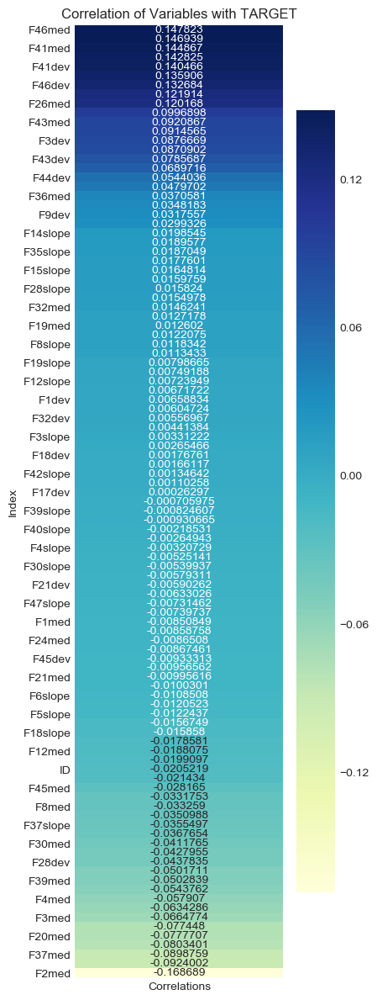

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

corr = data.corrwith(data['TARGET'])[:-1].reset_index()
corr.columns = ['Index', 'Correlations']
corr = corr.set_index('Index')
corr = corr.sort_values(by=['Correlations'], ascending = False)
plt.figure(figsize=(4,15))
fig = sns.heatmap(corr, annot=True, fmt="g", cmap='YlGnBu')
plt.title("Correlation of Variables with TARGET");

Рассмотрим более детально взаимосвязь наших признаков с целевой переменной:

Wall time: 0 ns


 95%|██████████████████████████████████████████████████████████████████████████████    | 20/21 [00:07<00:00,  3.09it/s]C:\Users\User\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [00:07<00:00,  3.29it/s]


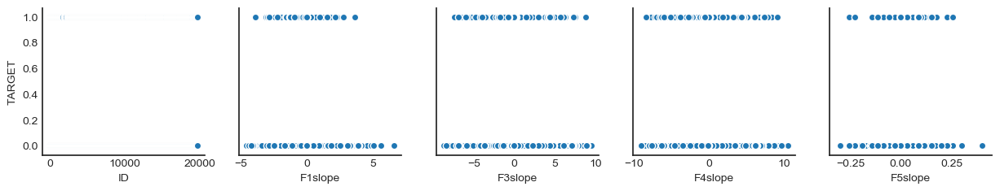

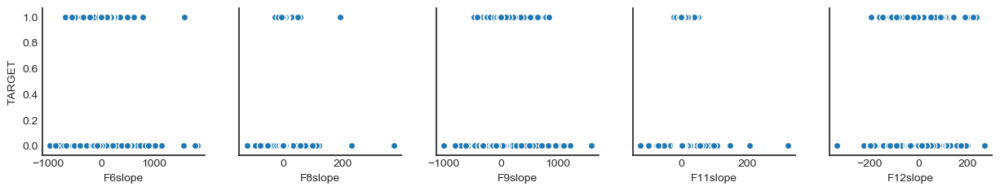

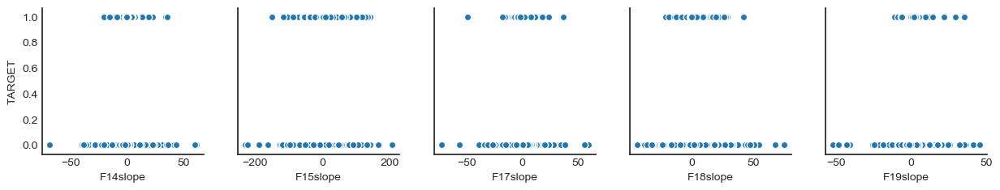

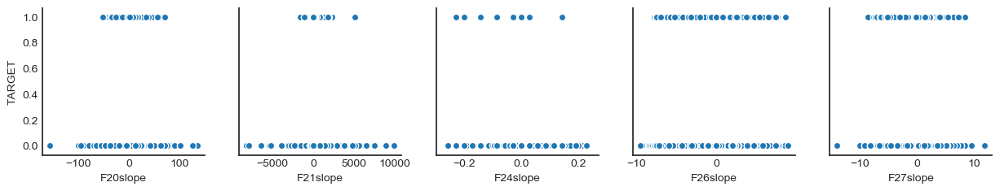

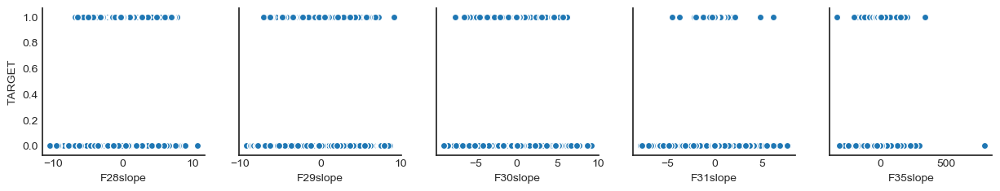

...

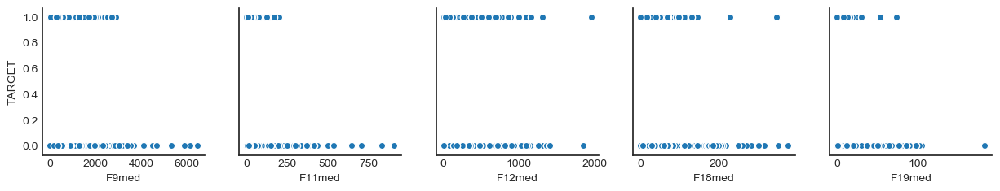

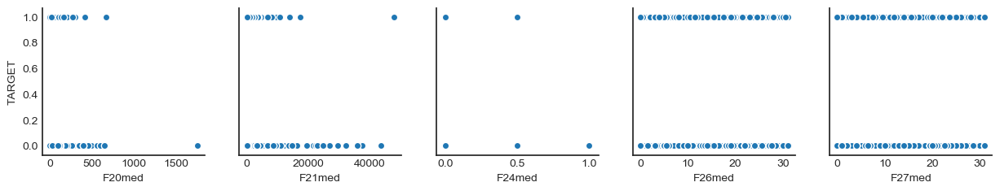

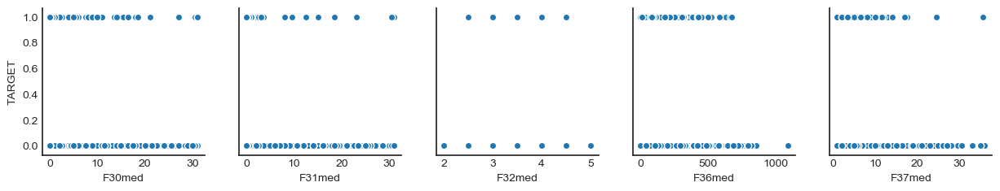

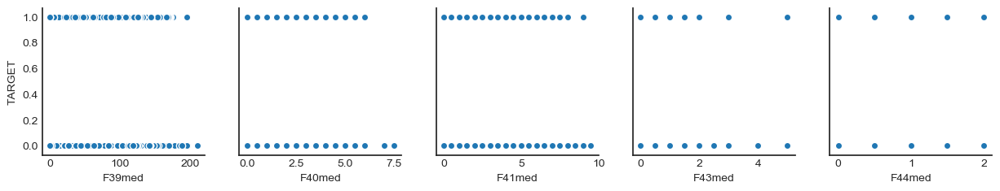

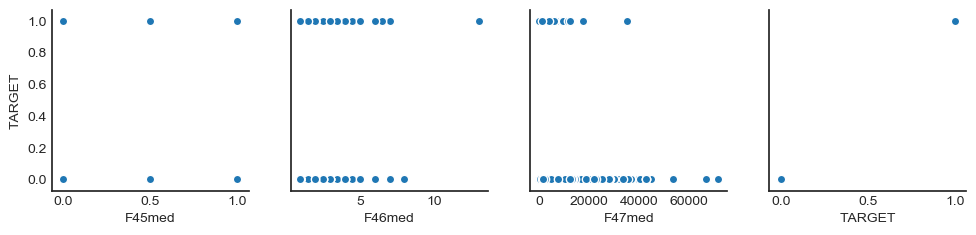

In [44]:
from tqdm import tqdm

%time
for i in tqdm(range(0, len(data.columns), 5)):
    sns.pairplot(data=data,
                x_vars=data.columns[i:i+5],
                y_vars=['TARGET'])

In [45]:

import sklearn
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, StratifiedKFold
import catboost
from catboost import CatBoostClassifier, Pool

In [46]:
y = data.TARGET
X = data.drop(['TARGET', 'ID'], axis=1, inplace=False)

In [47]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2,
random_state=1234)

In [48]:
#заполним пропуски после разбиения на тренировочную и обучающую выборки
#X_train = pd.DataFrame(X_train) применяем если inplace=True
#X_valid = pd.DataFrame(X_valid) применяем если inplace=True

In [56]:
X_train.isnull().sum()

F1slope     0
F3slope     0
F4slope     0
F5slope     0
F6slope     0
F8slope     0
F9slope     0
F11slope    0
F12slope    0
F14slope    0
F15slope    0
F17slope    0
F18slope    0
F19slope    0
F20slope    0
F21slope    0
F24slope    0
F26slope    0
F27slope    0
F28slope    0
F29slope    0
F30slope    0
F31slope    0
F35slope    0
F36slope    0
F37slope    0
F38slope    0
F39slope    0
F40slope    0
F41slope    0
F42slope    0
F43slope    0
F44slope    0
F45slope    0
F46slope    0
F47slope    0
F1dev       0
F2dev       0
F3dev       0
F4dev       0
F5dev       0
F6dev       0
F8dev       0
F9dev       0
F11dev      0
F12dev      0
F14dev      0
F15dev      0
F17dev      0
F18dev      0
F19dev      0
F20dev      0
F21dev      0
F24dev      0
F26dev      0
F27dev      0
F28dev      0
F29dev      0
F30dev      0
F31dev      0
F32dev      0
F36dev      0
F37dev      0
F39dev      0
F40dev      0
F41dev      0
F42dev      0
F43dev      0
F44dev      0
F45dev      0
F46dev      0
F47dev

In [55]:
X_valid.isnull().sum()

F1slope     0
F3slope     0
F4slope     0
F5slope     0
F6slope     0
F8slope     0
F9slope     0
F11slope    0
F12slope    0
F14slope    0
F15slope    0
F17slope    0
F18slope    0
F19slope    0
F20slope    0
F21slope    0
F24slope    0
F26slope    0
F27slope    0
F28slope    0
F29slope    0
F30slope    0
F31slope    0
F35slope    0
F36slope    0
F37slope    0
F38slope    0
F39slope    0
F40slope    0
F41slope    0
F42slope    0
F43slope    0
F44slope    0
F45slope    0
F46slope    0
F47slope    0
F1dev       0
F2dev       0
F3dev       0
F4dev       0
F5dev       0
F6dev       0
F8dev       0
F9dev       0
F11dev      0
F12dev      0
F14dev      0
F15dev      0
F17dev      0
F18dev      0
F19dev      0
F20dev      0
F21dev      0
F24dev      0
F26dev      0
F27dev      0
F28dev      0
F29dev      0
F30dev      0
F31dev      0
F32dev      0
F36dev      0
F37dev      0
F39dev      0
F40dev      0
F41dev      0
F42dev      0
F43dev      0
F44dev      0
F45dev      0
F46dev      0
F47dev

In [51]:
#импутация пропусков медианой
for i in ['F35slope',
'F36slope',
'F37slope',
'F38slope',
'F39slope',
'F40slope',
'F41slope',
'F42slope',
'F43slope',
'F44slope',
'F45slope',
'F46slope',
'F47slope',
'F36dev',
'F37dev',
'F39dev',
'F40dev',
'F41dev',
'F42dev',
'F43dev',
'F44dev',
'F45dev',
'F46dev',
'F47dev',  
'F36med',
'F37med',
'F39med',
'F40med',
'F41med',
'F43med',
'F44med',
'F45med',
'F46med',
'F47med']:
    if i in X_train.columns:
         X_train[i].fillna(X_train[i].median(), inplace=True)
for i in  [ 'F35slope',
'F36slope',
'F37slope',
'F38slope',
'F39slope',
'F40slope',
'F41slope',
'F42slope',
'F43slope',
'F44slope',
'F45slope',
'F46slope',
'F47slope',
'F36dev',
'F37dev',
'F39dev',
'F40dev',
'F41dev',
'F42dev',
'F43dev',
'F44dev',
'F45dev',
'F46dev',
'F47dev',  
'F36med',
'F37med',
'F39med',
'F40med',
'F41med',
'F43med',
'F44med',
'F45med',
'F46med',
'F47med']:
    if i in X_valid.columns:
        X_valid[i].fillna(X_train[i].median(), inplace=True)
        
        #проверим отсутствие пропусков код выше

C:\Users\User\Anaconda3\lib\site-packages\pandas\core\generic.py:5434: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


Максимизируем нормальность

In [78]:
a = 0.001

for i in ['F1dev',
'F2dev',
'F3dev',
'F4dev',
'F5dev',
'F6dev',
'F7dev',
'F8dev',
'F9dev',
'F10dev',
'F11dev',
'F12dev',
'F13dev',
'F14dev',
'F15dev',
'F16dev',
'F17dev',
'F18dev',
'F19dev',
'F20dev',
'F21dev',
'F22dev',
'F24dev',
'F26dev',
'F27dev',
'F28dev',
'F29dev',
'F30dev',
'F31dev',
'F32dev',
'F35dev',
'F36dev',
'F37dev',
'F38dev',
'F39dev',
'F40dev',
'F41dev',
'F42dev',
'F43dev',
'F44dev',
'F45dev',
'F46dev',
'F47dev',
'F2med',
'F3med',
'F4med',
'F5med',
'F6med',
'F7med',
'F8med',
'F9med',
'F10med',
'F11med',
'F12med',
'F13med',
'F14med',
'F15med',
'F16med',
'F17med',
'F18med',
'F19med',
'F20med',
'F21med',
'F22med',
'F24med',
'F26med',
'F27med',
'F28med',
'F29med',
'F30med',
'F31med',
'F32med',
'F35med',
'F36med',
'F37med',
'F38med',
'F39med',
'F40med',
'F41med',
'F42med',
'F43med',
'F44med',
'F45med','F46med', 'F47med']:
    if i in X_train.columns:
         X_train[i] = np.log(X_train[i] + a)

for i in ['F1dev',
'F2dev',
'F3dev',
'F4dev',
'F5dev',
'F6dev',
'F7dev',
'F8dev',
'F9dev',
'F10dev',
'F11dev',
'F12dev',
'F13dev',
'F14dev',
'F15dev',
'F16dev',
'F17dev',
'F18dev',
'F19dev',
'F20dev',
'F21dev',
'F22dev',
'F24dev',
'F26dev',
'F27dev',
'F28dev',
'F29dev',
'F30dev',
'F31dev',
'F32dev',
'F35dev',
'F36dev',
'F37dev',
'F38dev',
'F39dev',
'F40dev',
'F41dev',
'F42dev',
'F43dev',
'F44dev',
'F45dev',
'F46dev',
'F47dev',
'F2med',
'F3med',
'F4med',
'F5med',
'F6med',
'F7med',
'F8med',
'F9med',
'F10med',
'F11med',
'F12med',
'F13med',
'F14med',
'F15med',
'F16med',
'F17med',
'F18med',
'F19med',
'F20med',
'F21med',
'F22med',
'F24med',
'F26med',
'F27med',
'F28med',
'F29med',
'F30med',
'F31med',
'F32med',
'F35med',
'F36med',
'F37med',
'F38med',
'F39med',
'F40med',
'F41med',
'F42med',
'F43med',
'F44med',
'F45med','F46med', 'F47med']:
    if i in X_valid.columns:
        X_valid[i] = np.log(X_valid[i] + a)

C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:173: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [80]:
# Стандартизация приводим к единому масштабу еще способ
# выделяем количественные переменные в отдельный список
num_cols = [c for c in X_train.columns if X_train[c].dtype.name != 'object']
# создаем копию обучающего набора
X_train_copy = X_train.copy()
# выполняем стандартизацию
for i in num_cols:    
    X_train[i] = (X_train[i] - X_train[i].min()) / (X_train[i].max() - X_train[i].min())
    X_valid[i] = (X_valid[i] - X_train_copy[i].min()) / (X_train_copy[i].max() - X_train_copy[i].min())

C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [81]:
#Базовый Catboost
model = CatBoostClassifier(
    eval_metric='AUC',
    depth = 8,
    random_seed=42,
    loss_function='Logloss',
    logging_level='Silent'
)

In [82]:
#Базовый Catboost
model.fit(
      X_train, y_train, 
      eval_set=(X_valid, y_valid), 
      use_best_model=True,
      plot=True
)

Learning rate set to 0.09969


MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [83]:
from sklearn.metrics import roc_auc_score

In [84]:

# печатаем значение AUC для контрольной выборки
print('AUC модели на обучающей выборке: {:.3}'.format(
    roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])))
print('AUC модели на контрольной выборке: {:.3}'.format(
    roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1])))

AUC модели на обучающей выборке: 0.857
AUC модели на контрольной выборке: 0.772


In [129]:
#Подкрученый Catboost
modelup = CatBoostClassifier(
         logging_level='Silent',
         iterations=1000, depth=8, 
         learning_rate=0.01, 
         loss_function='Logloss',
         random_strength= 0.1,
         bagging_temperature=0.1,
         eval_metric =  'AUC', 
         l2_leaf_reg= 30, 
         use_best_model = True,
         random_seed = 17)

In [130]:
 modelup.fit(
      X_train, y_train,
      eval_set=(X_valid, y_valid), 
      use_best_model=True,
      plot=True
)

MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [132]:
print('AUC модели на обучающей выборке: {:.3}'.format(
    roc_auc_score(y_train, modelup.predict_proba(X_train)[:, 1])))
print('AUC модели на контрольной выборке: {:.3}'.format(
    roc_auc_score(y_valid, modelup.predict_proba(X_valid)[:, 1])))
#лучший результат

AUC модели на обучающей выборке: 0.855
AUC модели на контрольной выборке: 0.776


Кросс-валидация модели

In [88]:
from catboost import cv
cv_data = cv(
    pool= Pool(X, label=y), 
    params= modelup.get_params(),
    fold_count=5, 
    shuffle=True,
    plot=True)
       #partition_random_seed=0
    #stratified=False
    # verbose=False
 


MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [89]:
print('Наилучшее значение AUC на валидационном наборе: {:.2f}±{:.2f} на шаге {}'.format(
    np.max(cv_data['test-AUC-mean']),
    cv_data['test-AUC-std'][cv_data['test-AUC-mean'].idxmax()],
    cv_data['test-AUC-mean'].idxmax())
)

Наилучшее значение AUC на валидационном наборе: 0.75±0.02 на шаге 804


In [90]:
print('Точечное значение AUC на валидационном наборе: {}'.format(np.max(cv_data['test-AUC-mean'])))

Точечное значение AUC на валидационном наборе: 0.7542184943459722


Первоначальная оценка качества при однократном разбиении была слишком оптимистичной - вот почему кросс-валидация так важна!

In [91]:
# Применение модели получим прогнозы 
Test_label = pd.read_csv("D:\Python\Task_BigDataSchool\BigDataSchool3\BigDataSchool_test_set.csv", sep=",")
data_test = Train.merge(Test_label)

In [92]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4305 entries, 0 to 4304
Columns: 104 entries, ID to TARGET
dtypes: float64(103), int64(1)
memory usage: 3.4 MB


In [93]:
data_test.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,4305.0,10234.606736,5500.160235,1.000000,5761.000000,10372.000000,14917.000000,19680.000000
F1slope,4305.0,-0.013008,0.443163,-4.571429,0.000000,0.000000,0.000000,5.142857
F3slope,4305.0,0.010773,1.549943,-8.100000,-0.400000,0.000000,0.314286,9.000000
F4slope,4305.0,0.103786,1.781479,-8.900000,-0.142857,0.000000,0.200000,10.900000
F5slope,4305.0,0.000029,0.038466,-0.300000,0.000000,0.000000,0.000000,0.300000
F6slope,4305.0,5.521641,95.647475,-1105.800581,-16.052907,0.000571,23.761395,1098.059000
F8slope,4305.0,0.429854,4.910610,-36.728000,-0.385143,0.000000,0.632571,92.596571
F9slope,4305.0,4.517093,83.185421,-941.413714,-17.107797,0.000000,22.762571,972.274000
F11slope,4305.0,0.430807,6.417354,-66.644857,-0.593429,0.000000,0.993256,123.524000
F12slope,4305.0,0.050331,23.791864,-190.742857,-8.000000,-0.028571,7.742857,208.885714


In [94]:
 test = data_test.drop(['TARGET'], axis=1, inplace=False)

In [95]:
test.isnull().sum()

ID            0
F1slope       0
F3slope       0
F4slope       0
F5slope       0
F6slope       0
F8slope       0
F9slope       0
F11slope      0
F12slope      0
F14slope      0
F15slope      0
F17slope      0
F18slope      0
F19slope      0
F20slope      0
F21slope      0
F24slope      0
F26slope      0
F27slope      0
F28slope      0
F29slope      0
F30slope      0
F31slope      0
F35slope     22
F36slope     20
F37slope    287
F38slope    290
F39slope    367
F40slope    371
F41slope    370
F42slope    369
F43slope    509
F44slope    504
F45slope    505
F46slope    419
F47slope    414
F1dev         0
F2dev         0
F3dev         0
F4dev         0
F5dev         0
F6dev         0
F8dev         0
F9dev         0
F11dev        0
F12dev        0
F14dev        0
F15dev        0
F17dev        0
F18dev        0
F19dev        0
F20dev        0
F21dev        0
F24dev        0
F26dev        0
F27dev        0
F28dev        0
F29dev        0
F30dev        0
F31dev        0
F32dev        0
F36dev  

In [96]:
for i in  [ 'F35slope',
'F36slope',
'F37slope',
'F38slope',
'F39slope',
'F40slope',
'F41slope',
'F42slope',
'F43slope',
'F44slope',
'F45slope',
'F46slope',
'F47slope',
'F36dev',
'F37dev',
'F39dev',
'F40dev',
'F41dev',
'F42dev',
'F43dev',
'F44dev',
'F45dev',
'F46dev',
'F47dev',  
'F36med',
'F37med',
'F39med',
'F40med',
'F41med',
'F43med',
'F44med',
'F45med',
'F46med',
'F47med']:
    if i in test.columns:
        test[i].fillna(X_train[i].median(), inplace=True)

In [97]:
columns=[
"F1slope",
"F3slope",
"F4slope",
"F5slope",
"F6slope",
"F8slope",
"F9slope",
"F11slope",
"F12slope",
"F14slope",
"F15slope",
"F17slope",
"F18slope",
"F19slope",
"F20slope",
"F21slope",
"F24slope",
"F26slope",
"F27slope",
"F28slope",
"F29slope",
"F30slope",
"F31slope",
"F35slope",
"F36slope",
"F37slope",
"F38slope",
"F39slope",
"F40slope",
"F41slope",
"F42slope",
"F43slope",
"F44slope",
"F45slope",
"F46slope",
"F47slope",
"F1dev",
"F2dev",
"F3dev",
"F4dev",
"F5dev",
"F6dev",
"F8dev",
"F9dev",
"F11dev",
"F12dev",
"F14dev",
"F15dev",
"F17dev",
"F18dev",
"F19dev",
"F20dev",
"F21dev",
"F24dev",
"F26dev",
"F27dev",
"F28dev",
"F29dev",
"F30dev",
"F31dev",
"F32dev",
"F36dev",
"F37dev",
"F39dev",
"F40dev",
"F41dev",
"F42dev",
"F43dev",
"F44dev",
"F45dev",
"F46dev",
"F47dev",
"F1med",
"F2med",
"F3med",
"F4med",
"F5med",
"F6med",
"F8med",
"F9med",
"F11med",
"F12med",
"F18med",
"F19med",
"F20med",
"F21med",
"F24med",
"F26med",
"F27med",
"F30med",
"F31med",
"F32med",
"F36med",
"F37med",
"F39med",
"F40med",
"F41med",
"F43med",
"F44med",
"F45med",
"F46med",
"F47med"]
predictions = modelup.predict(test[columns])
predictions_probs = modelup.predict_proba(test[columns])
print(predictions[:10])
print(predictions_probs[:10])

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
[[ 0.53606203  0.46393797]
 [ 0.60481402  0.39518598]
 [ 0.62635679  0.37364321]
 [ 0.59895541  0.40104459]
 [ 0.59921218  0.40078782]
 [ 0.55564023  0.44435977]
 [ 0.638641    0.361359  ]
 [ 0.54845694  0.45154306]
 [ 0.57947802  0.42052198]
 [ 0.56675082  0.43324918]]


In [98]:
#посылка

columns=[
"F1slope",
"F3slope",
"F4slope",
"F5slope",
"F6slope",
"F8slope",
"F9slope",
"F11slope",
"F12slope",
"F14slope",
"F15slope",
"F17slope",
"F18slope",
"F19slope",
"F20slope",
"F21slope",
"F24slope",
"F26slope",
"F27slope",
"F28slope",
"F29slope",
"F30slope",
"F31slope",
"F35slope",
"F36slope",
"F37slope",
"F38slope",
"F39slope",
"F40slope",
"F41slope",
"F42slope",
"F43slope",
"F44slope",
"F45slope",
"F46slope",
"F47slope",
"F1dev",
"F2dev",
"F3dev",
"F4dev",
"F5dev",
"F6dev",
"F8dev",
"F9dev",
"F11dev",
"F12dev",
"F14dev",
"F15dev",
"F17dev",
"F18dev",
"F19dev",
"F20dev",
"F21dev",
"F24dev",
"F26dev",
"F27dev",
"F28dev",
"F29dev",
"F30dev",
"F31dev",
"F32dev",
"F36dev",
"F37dev",
"F39dev",
"F40dev",
"F41dev",
"F42dev",
"F43dev",
"F44dev",
"F45dev",
"F46dev",
"F47dev",
"F1med",
"F2med",
"F3med",
"F4med",
"F5med",
"F6med",
"F8med",
"F9med",
"F11med",
"F12med",
"F18med",
"F19med",
"F20med",
"F21med",
"F24med",
"F26med",
"F27med",
"F30med",
"F31med",
"F32med",
"F36med",
"F37med",
"F39med",
"F40med",
"F41med",
"F43med",
"F44med",
"F45med",
"F46med",
"F47med"]

submission = pd.DataFrame()
submission['ID'] = test['ID']
submission['TARGET'] = modelup.predict(test[columns])
submission.head()

,ID,TARGET
0,1,0.0
1,3,0.0
2,6,0.0
3,7,0.0
4,12,0.0


In [99]:
print(submission['TARGET'].value_counts(dropna=False).tail(10))
#Дисбаланс классов у предикшена

0.0    4286
1.0      19
Name: TARGET, dtype: int64


In [100]:
#подготовим файл посылки:
submission.to_csv('D:\Python\Task_BigDataSchool\BigDataSchool3\submission.csv', index = False)

In [101]:
#посылка вероятности
columns=[
"F1slope",
"F3slope",
"F4slope",
"F5slope",
"F6slope",
"F8slope",
"F9slope",
"F11slope",
"F12slope",
"F14slope",
"F15slope",
"F17slope",
"F18slope",
"F19slope",
"F20slope",
"F21slope",
"F24slope",
"F26slope",
"F27slope",
"F28slope",
"F29slope",
"F30slope",
"F31slope",
"F35slope",
"F36slope",
"F37slope",
"F38slope",
"F39slope",
"F40slope",
"F41slope",
"F42slope",
"F43slope",
"F44slope",
"F45slope",
"F46slope",
"F47slope",
"F1dev",
"F2dev",
"F3dev",
"F4dev",
"F5dev",
"F6dev",
"F8dev",
"F9dev",
"F11dev",
"F12dev",
"F14dev",
"F15dev",
"F17dev",
"F18dev",
"F19dev",
"F20dev",
"F21dev",
"F24dev",
"F26dev",
"F27dev",
"F28dev",
"F29dev",
"F30dev",
"F31dev",
"F32dev",
"F36dev",
"F37dev",
"F39dev",
"F40dev",
"F41dev",
"F42dev",
"F43dev",
"F44dev",
"F45dev",
"F46dev",
"F47dev",
"F1med",
"F2med",
"F3med",
"F4med",
"F5med",
"F6med",
"F8med",
"F9med",
"F11med",
"F12med",
"F18med",
"F19med",
"F20med",
"F21med",
"F24med",
"F26med",
"F27med",
"F30med",
"F31med",
"F32med",
"F36med",
"F37med",
"F39med",
"F40med",
"F41med",
"F43med",
"F44med",
"F45med",
"F46med",
"F47med"]

submission_prob = pd.DataFrame()
submission_prob['ID'] = test['ID']
submission_prob['TARGET'] = modelup.predict_proba(test[columns])[:, 1]
submission_prob.head()
#подготовим файл посылки:
submission_prob.to_csv('D:\Python\Task_BigDataSchool\BigDataSchool3\submission_prob.csv', index = False)

In [131]:
#Важность признаков метод get_feature_importance
train_pool = Pool(X_train, y_train)    
    
    
model = CatBoostClassifier(
         logging_level='Silent',
         iterations=300, depth=8, 
         learning_rate=0.1, 
         loss_function='Logloss',
         random_strength= 0.1,
         bagging_temperature=0.1,
         eval_metric =  'AUC', 
         l2_leaf_reg= 30, 
         use_best_model = True,
         random_seed = 17).fit(train_pool,  eval_set=(X_valid, y_valid), 
      use_best_model=True)
feature_importances = modelup.get_feature_importance(train_pool)
feature_names = Train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse = True):
    print('{}: {}'.format(name, score))

F1med: 16.394437591193846
F26med: 5.01191343198994
F12med: 4.778650080147836
F39med: 3.708664015875858
F41med: 3.5870277830587236
F5med: 2.9993074061837386
F32dev: 2.9725436306762605
F40dev: 2.971071669304297
F32med: 2.9229015661873508
F2med: 2.428378547637559
F40med: 2.3666676364595034
F45med: 2.093705994191836
F24med: 1.9048143712253898
F8med: 1.8808922087057134
F45dev: 1.8417936037782818
F36dev: 1.7839846555715841
F18med: 1.7317074359339366
F27dev: 1.6545398208983728
F11dev: 1.4752753231348592
F19med: 1.431344473339629
F12slope: 1.3794899380526764
F39dev: 1.0302805674194844
F3dev: 0.9347978857558586
F18slope: 0.9079828298320756
F6slope: 0.8951920561275023
F26dev: 0.8770668109658906
F2dev: 0.8655162369381483
F45slope: 0.799396131983745
F19dev: 0.7328257153974618
F43slope: 0.7285931410971462
F37dev: 0.7006368015626622
F26slope: 0.6928876553310265
F27slope: 0.683987630526795
F1slope: 0.6816202461596874
F24dev: 0.6563134529768746
F37slope: 0.6520345962498585
F6med: 0.6319401134019462
F5

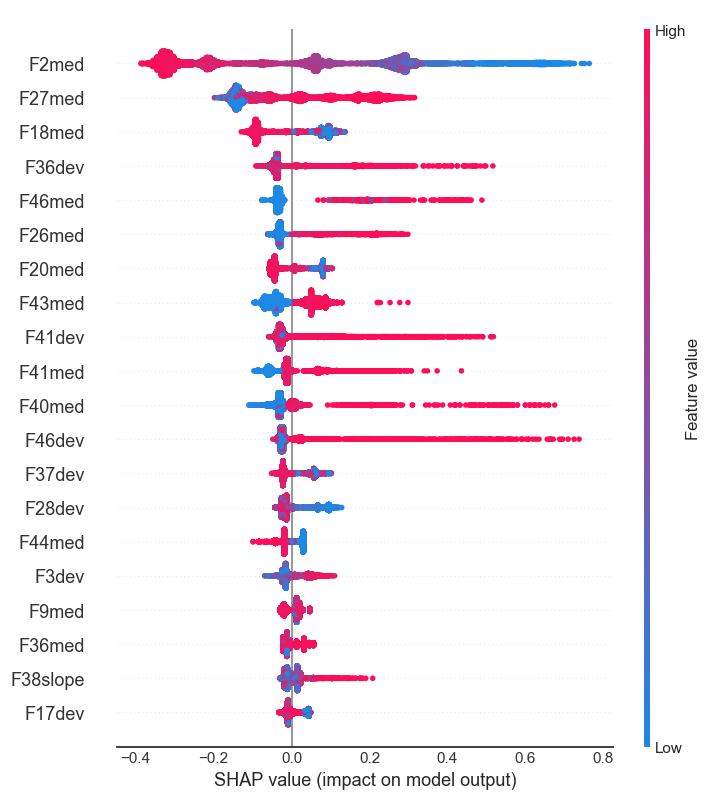

In [133]:
import shap
shap_values = modelup.get_feature_importance(train_pool, fstr_type='ShapValues')
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_pool)
shap.summary_plot(shap_values, X_train)

Другие алгоритмы

Логистическая регрессия

In [121]:
# импортируем класс LogisticRegression
from sklearn.linear_model import LogisticRegression
# создаем экземпляр класса LogisticRegression
# и обучаем модель
logreg = LogisticRegression().fit(X_train, y_train)
# оцениваем дискриминирующую способность 
# модели логистической регрессии
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_train, logreg.predict_proba(X_train)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, logreg.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 0.755
AUC на контрольной выборке: 0.774


Случайный лес

In [122]:
from sklearn.ensemble import RandomForestClassifier
# создаем экземпляр класса RandomForestClassifier
forest=RandomForestClassifier(n_estimators=800, max_depth=17, 
                              random_state=152, n_jobs=-1, oob_score=True)
# строим модель
forest.fit(X_train, y_train)
# оцениваем дискриминирующую способность 
# модели случайного леса
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_train, forest.predict_proba(X_train)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, forest.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 1.000
AUC на контрольной выборке: 0.746


KNN

In [123]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score


knn_pipe = Pipeline([('scaler', StandardScaler()), ('knn', KNeighborsClassifier(n_jobs=-1))])

knn_params = {'knn__n_neighbors': range(1, 10)}

knn_grid = GridSearchCV(knn_pipe, knn_params,
cv=5, n_jobs=-1,
verbose=True)

knn_grid.fit(X_train, y_train)

knn_grid.best_params_, knn_grid.best_score_

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  4.2min finished


({'knn__n_neighbors': 8}, 0.91922032583397983)

In [124]:
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_train, knn_grid.predict_proba(X_train)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, knn_grid.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 0.878
AUC на контрольной выборке: 0.623


Попытка устранить влияние дисбаланса классов

In [108]:
# импортируем класс RandomOverSampler

from imblearn.over_sampling import RandomOverSampler

In [109]:
# устраняем дисбаланс классов  создаем экземпляр класса RandomOverSampler
ros = RandomOverSampler(ratio={0:11848, 1:1042}, random_state=42)
# обучаем модель RandomOverSampler, т.е. выполняем семплинг, 
# создав новые наборы данных
X_resampled, y_resampled = ros.fit_sample(X_train, y_train)
# Спойлер не помогло

C:\Users\User\Anaconda3\lib\site-packages\imblearn\utils\validation.py:224: UserWarning: After over-sampling, the number of samples (11848) in class 0 will be larger than the number of samples in the majority class (class #0.0 -> 9482)
  n_samples_majority))


In [110]:
# устраняем дисбаланс классов 2 способ импортируем класс SMOTE
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=152, kind='borderline2',
n_jobs=-1)
X_smote, y_smote = smote.fit_sample(X_train, y_train)

In [111]:
# импортируем класс LogisticRegression
from sklearn.linear_model import LogisticRegression
# создаем экземпляр класса LogisticRegression
# и обучаем модель
logreg = LogisticRegression().fit(X_resampled, y_resampled)
# оцениваем дискриминирующую способность 
# модели логистической регрессии
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_resampled, logreg.predict_proba(X_resampled)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, logreg.predict_proba(X_valid)[:, 1])))

AUC на обучающей выборке: 0.757
AUC на контрольной выборке: 0.773


In [112]:

logreg = LogisticRegression().fit(X_smote, y_smote)
# оцениваем дискриминирующую способность 
# модели логистической регрессии
print("AUC на обучающей выборке: {:.3f}".
      format(roc_auc_score(y_smote, logreg.predict_proba(X_smote)[:, 1])))
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, logreg.predict_proba(X_valid)[:, 1])))

# чуть хуже чем 1 способ оверсэмплинга 

AUC на обучающей выборке: 0.811
AUC на контрольной выборке: 0.771


In [140]:
#хуже при использовании оверсэмплинга
modelup.fit(
      X_smote, y_smote,
      eval_set=(X_valid, y_valid), 
      use_best_model=True,
      plot=True
)

MetricVisualizer(data={'catboost_info': {'path': 'catboost_info', 'name': 'catboost_info', 'content': {'passed…

In [73]:
# Стандартизация приводим к единому масштабу еще способ
# выделяем количественные переменные в отдельный список
#num_cols = [c for c in X_train.columns if X_train[c].dtype.name != 'object']
# создаем копию обучающего набора
#X_train_copy = X_train.copy()
# выполняем стандартизацию
#for i in num_cols:    
   # X_train[i] = (X_train[i] - X_train[i].min()) / (X_train[i].max() - X_train[i].min())
    #X_valid[i] = (X_valid[i] - X_train_copy[i].min()) / (X_train_copy[i].max() - X_train_copy[i].min())

In [113]:
# Стандартизация приводим к единому масштабу
# выделяем количественные переменные в отдельный список
#num_cols = [c for c in X_train.columns if X_train[c].dtype.name != 'object']
# создаем копию обучающего набора
#X_train_copy = X_train.copy()
# выполняем стандартизацию
#for i in num_cols:    
  #  X_train[i] = (X_train[i] - X_train[i].mean()) / X_train[i].std()
  #  X_valid[i] = (X_valid[i] - X_train_copy[i].mean()) / X_train_copy[i].std()

Стекинг

In [115]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from vecstack import stacking

In [143]:
models = [
    logreg,
        
    forest,
        
   
    knn_grid
]

In [144]:
S_train, S_test = stacking(models,                   
                           X_train, y_train, X_valid,   
                           regression=False, 
     
                           mode='oof_pred_bag', 
       
                           needs_proba=False,
         
                           save_dir=None, 
            
                           metric=roc_auc_score, 
    
                           n_folds=4, 
                 
                           stratified=True,
            
                           shuffle=True,  
            
                           random_state=0,    
         
                          verbose=2)

task:         [classification]
n_classes:    [2]
metric:       [roc_auc_score]
mode:         [oof_pred_bag]
n_models:     [3]

model  0:     [LogisticRegression]
    fold  0:  [0.50480769]
    fold  1:  [0.50438593]
    fold  2:  [0.50682444]
    fold  3:  [0.50598055]
    ----
    MEAN:     [0.50549965] + [0.00096248]
    FULL:     [0.50549678]

model  1:     [RandomForestClassifier]
    fold  0:  [0.50198208]
    fold  1:  [0.49957824]
    fold  2:  [0.50241546]
    fold  3:  [0.50000000]
    ----
    MEAN:     [0.50099394] + [0.00122365]
    FULL:     [0.50099389]

model  2:     [GridSearchCV]
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  2.0min finished


    fold  0:  [0.49978912]
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  2.2min finished


    fold  1:  [0.50156032]
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  2.0min finished


    fold  2:  [0.49957806]
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  2.0min finished


    fold  3:  [0.50220449]
    ----
    MEAN:     [0.50078300] + [0.00112523]
    FULL:     [0.50078297]



In [145]:
model = XGBClassifier(random_state=0, n_jobs=-1, learning_rate=0.1, 
                      n_estimators=100, max_depth=3)
    
model = model.fit(S_train, y_train)
y_pred = model.predict(S_test)
print('Final prediction score: [%.8f]' % accuracy_score(y_valid, y_pred))


Final prediction score: [0.91776571]


In [146]:
print("AUC на контрольной выборке: {:.3f}".
      format(roc_auc_score(y_valid, model.predict_proba(S_test)[:, 1])))

AUC на контрольной выборке: 0.504
